This exploratory data analysis is designed to be tbe back drop for a web application that allows users to select any variable in the vehicles data set and find its assocation with any other variable in the vehicles data set. Therefore, the below data analysis werves two purposes:

1. It provides anyone interested in setting up this app for themselves a review of the data set they will be workig with
2. It provides all of the correlations that will displayed in the app at the app user's discretion. This way, anyone who wants to set this app up for themselves can use this notebook, and the statistical analyses contained herein, to guide their design of the app, and check to make sure the app is outputting the correct values.

The purpose of the app itself is to allow the dealership who produced the data to begin with, and prospective consumers access to any statstical association between any two variables that might inform their approach to increasing revenue (for the dealership) or shoppoing for a used car (the prospective consumers). 

In [1]:
# Standard library imports
import itertools

# Third-party imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import pearsonr, anderson, chi2_contingency, f_oneway, spearmanr
import streamlit as st

# Inline plotting (if you use Jupyter Notebooks or similar)
%matplotlib inline

In [2]:
# Load the data set as a DataFrame 
vehicles_df = pd.read_csv(r'C:\Users\brttk\Documents\sprint_4_project\notebooks\vehicles_us.csv')

In [3]:
# Display the DataFrame.
print(vehicles_df.head(20))

# Get a look at the DataFrame's non-null values and data types. 
vehicles_df.info()

    price  model_year                     model  condition  cylinders fuel  \
0    9400      2011.0                    bmw x5       good        6.0  gas   
1   25500         NaN                ford f-150       good        6.0  gas   
2    5500      2013.0            hyundai sonata   like new        4.0  gas   
3    1500      2003.0                ford f-150       fair        8.0  gas   
4   14900      2017.0              chrysler 200  excellent        4.0  gas   
5   14990      2014.0              chrysler 300  excellent        6.0  gas   
6   12990      2015.0              toyota camry  excellent        4.0  gas   
7   15990      2013.0               honda pilot  excellent        6.0  gas   
8   11500      2012.0               kia sorento  excellent        4.0  gas   
9    9200      2008.0               honda pilot  excellent        NaN  gas   
10  19500      2011.0  chevrolet silverado 1500  excellent        8.0  gas   
11   8990      2012.0              honda accord  excellent      

Price probably should have been a float64 data type, but there is no benefit to correcting it now. The 'model_year' and 'cylinders' columns should be int64 datatypes. However, ultimately we are going to want the NaN values to remain because it will make the code for our correlation analyses simpler (because we can apply .dropna() instead of filtering the whole DataFrame). Since the presence of NaN values will autmatically conver the column to a float64 data type, we will just leave these columns as they are. Similarly, date_posted should be a date time data type. We will change this shortly. However, first we have to check for NaN values in those columns because they will hinder the conversion. 

In [4]:
vehicles_df.isna().sum()

price               0
model_year       3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64

That is a lot of NaN values. Fortunately, we are running a columnwise analysis. Therefore, we will simply drop Nan values for the two columns we are comparing rathe than unnecessarily reduce our sample size by dropping values because another column has an NaN value in that row. As a result, we can afford to ignore the NaN values. Let's brielfy check to see if there are any duplicate rows. Afer that, we will convert the date_posted column to a date time data type. 

In [5]:
# Check for duplicated rows. 
vehicles_df.duplicated().sum()

np.int64(0)

There are no duplicate rows in the DataFrame. Since we would expect there to be duplicate values for each of our columns, there is nothing to be gained from running duplicated().sum() on our columns. Instead, let's now convert the date_posted column to a date time data type. 

In [6]:
# Convert date_posted' to datetime data type.
vehicles_df['date_posted'] = pd.to_datetime(vehicles_df['date_posted'])

# Check to make sure the conversion went through.
print(f"'date_posted' data type: {vehicles_df['date_posted'].dtype}")


'date_posted' data type: datetime64[ns]


The conversion went through. Now let's try check out the NaN values in the is_4wd column. 

In [7]:
# Let's check to see if there are any values in the is4wd column other than NaN and 1.0.
# We use .isna() to check for NaN, and directly check for 1.0

# Filter for values other than 1.0 and NaN in the is_4wd column and assign it to non_nan_or_one
non_nan_or_one = vehicles_df[~vehicles_df['is_4wd'].isin([1.0]) & ~vehicles_df['is_4wd'].isna()]

# If there are any rows, it means there are values other than NaN or 1.0
if not non_nan_or_one.empty:
    print("There are values other than NaN or 1.0:")
    print(non_nan_or_one)
else:
    print("All values are either NaN or 1.0.")

All values are either NaN or 1.0.


Since there are no values other than NaN or 1.0, it is reasonable to conclude that 1.0 values mean the vehicle is 4 wbeel drive,
and NaN values mean that it is not 4 wheel drive. Moreover, since we are running columnwise correlation analyses, adopting this 
approach will not invalidate our results. Instead, we will just make a note that we are making this assumption about the is_4wd column. Let's replace the NaN values with 'no' and the 1.0 values with 'yes' using the below code. 

In [8]:
# Replace NaN values with 'no' and 1.0 values with 'yes' 
vehicles_df['is_4wd'] = vehicles_df['is_4wd'].replace({1.0: 'yes', float('NaN'): 'no'})

# Display results to make sure the values were replaced as intended
vehicles_df


,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,yes,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,yes,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,no,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,no,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,no,2019-04-02,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51520,9249,2013.0,nissan maxima,like new,6.0,gas,88136.0,automatic,sedan,black,no,2018-10-03,37
51521,2700,2002.0,honda civic,salvage,4.0,gas,181500.0,automatic,sedan,white,no,2018-11-14,22
51522,3950,2009.0,hyundai sonata,excellent,4.0,gas,128000.0,automatic,sedan,blue,no,2018-11-15,32
51523,7455,2013.0,toyota corolla,good,4.0,gas,139573.0,automatic,sedan,black,no,2018-07-02,71


We successfully addressed the NaN values in the is_4wd column. Next we will inspect the DataFrame for non-standard null values. 

In [9]:
# Defining a list of non-standard placeholders we want to check for. 
non_standard_values = ['', 'na', 'null', 'missing']

# Create DataFrame that contains only object datatypes.  
categorical_df = vehicles_df.select_dtypes(include=[object])

# Iterating over all columns with categorical variables. 
for col in categorical_df:
    # Getting rid of all leading or trailing spaces and making all of the object data type columns lower case. 
    categorical_df[col] = categorical_df[col].str.strip().str.lower()
    # Calculating the number of non-standard null values in 'paint_color' and assigning that value to msk_null_paint_color
    mask_null_paint_color = categorical_df[col].isin(non_standard_values).sum()
    # Printing the number of non-standard null values for each column 
    print(f"There are {mask_null_paint_color} non-standard null values in the '{col}' column.")


There are 0 non-standard null values in the 'model' column.
There are 0 non-standard null values in the 'condition' column.
There are 0 non-standard null values in the 'fuel' column.
There are 0 non-standard null values in the 'transmission' column.
There are 0 non-standard null values in the 'type' column.
There are 0 non-standard null values in the 'paint_color' column.
There are 0 non-standard null values in the 'is_4wd' column.


We've confirmed that there are no non-standard null values in our DataFrame. We will Now let's enrich our DataFrame by adding a season_posted column. 

In [10]:


# Create a function to determine the season based on the month.
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Create the 'season_posted' column by running the values of 'date_posted' through the get_season function with .apply().
vehicles_df['season_posted'] = vehicles_df['date_posted'].dt.month.apply(get_season)

# Verify the first few rows.
print(vehicles_df[['date_posted', 'season_posted']].head())

  date_posted season_posted
0  2018-06-23        Summer
1  2018-10-19          Fall
2  2019-02-07        Winter
3  2019-03-22        Spring
4  2019-04-02        Spring


Now we'd like to add a 'manufacturer' column.

In [11]:
# Create a manufacturer column by running the 'model' column through the lambda x: x.split()[0] function with .apply()
vehicles_df['manufacturer'] = vehicles_df['model'].apply(lambda x: x.split()[0])

# Display the DataFrame with the new column 
vehicles_df

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,season_posted,manufacturer
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,yes,2018-06-23,19,Summer,bmw
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,yes,2018-10-19,50,Fall,ford
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,no,2019-02-07,79,Winter,hyundai
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,no,2019-03-22,9,Spring,ford
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,no,2019-04-02,28,Spring,chrysler
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51520,9249,2013.0,nissan maxima,like new,6.0,gas,88136.0,automatic,sedan,black,no,2018-10-03,37,Fall,nissan
51521,2700,2002.0,honda civic,salvage,4.0,gas,181500.0,automatic,sedan,white,no,2018-11-14,22,Fall,honda
51522,3950,2009.0,hyundai sonata,excellent,4.0,gas,128000.0,automatic,sedan,blue,no,2018-11-15,32,Fall,hyundai
51523,7455,2013.0,toyota corolla,good,4.0,gas,139573.0,automatic,sedan,black,no,2018-07-02,71,Summer,toyota


Let's a get a closer look at our DataFrame. We're going to plot a histogram to view the distribution for each of our columns/variables. There are two many value types in the model column for us to use subplots() without the plot becoming to condensed. To maintain viewability we are going to go with plt.show() for the 'model' column. 

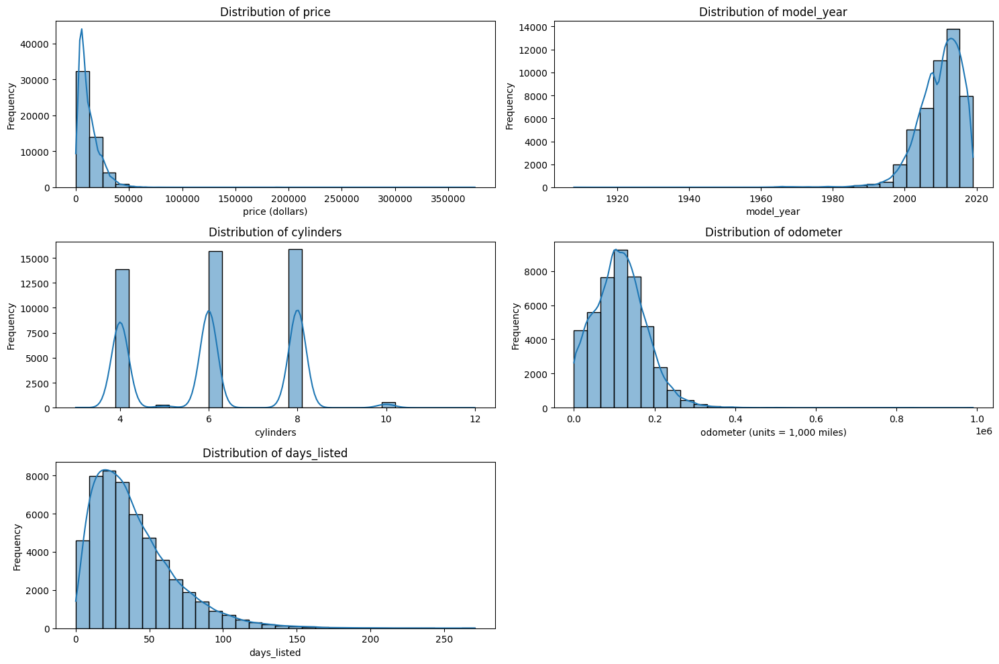

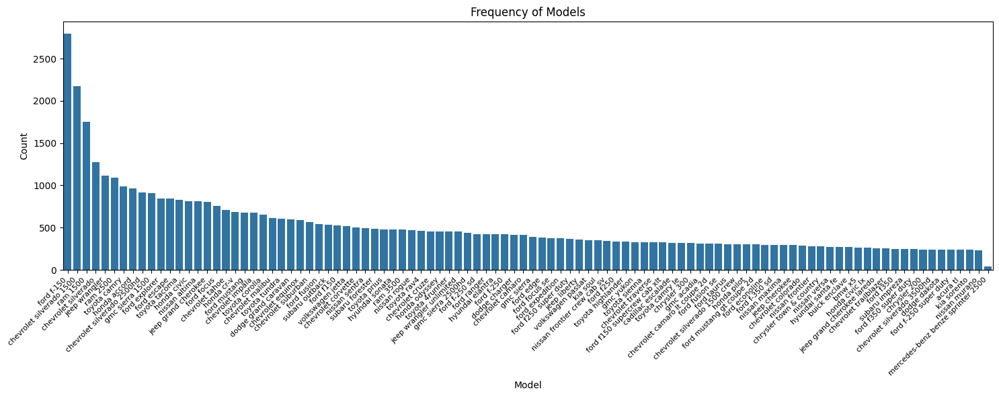

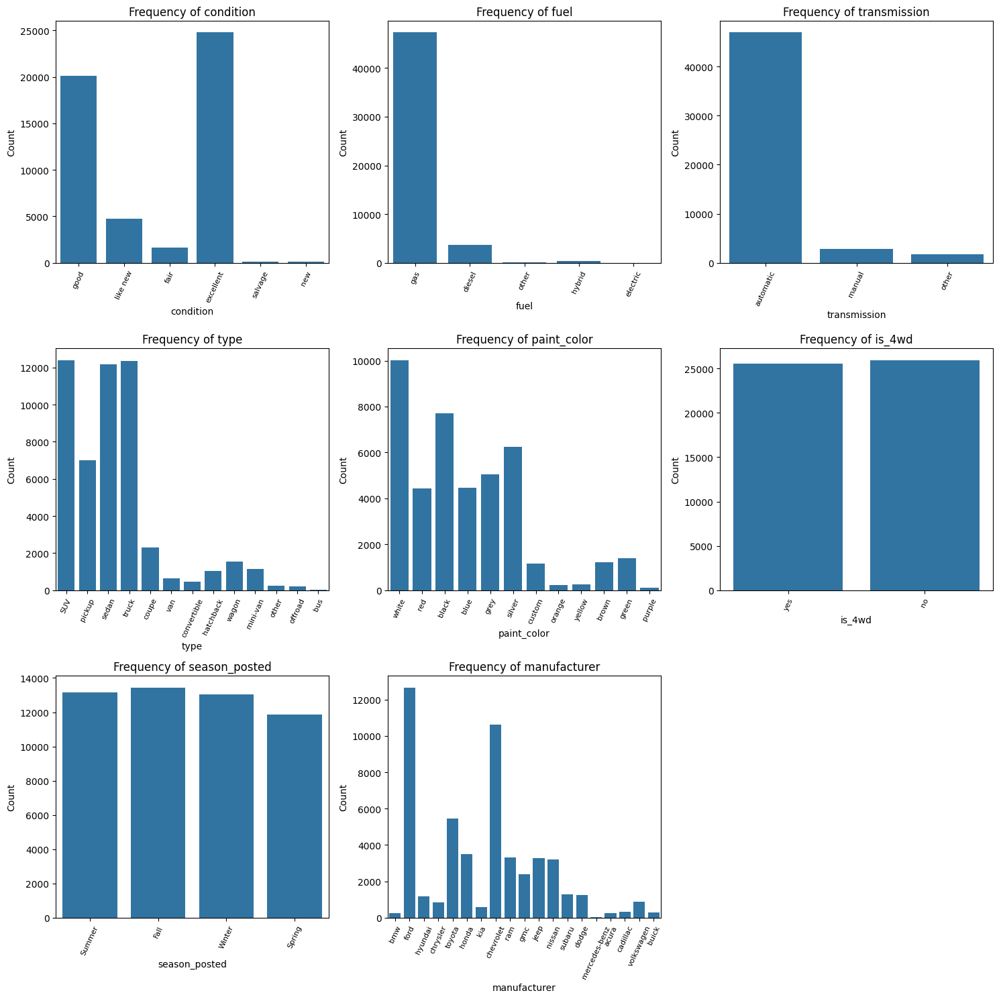

In [12]:
# Split the columns into numeric and categorical columns
numeric_columns = ['price', 'model_year', 'cylinders', 'odometer', 'days_listed']
categorical_columns = ['model', 'condition', 'fuel', 'transmission', 'type', 'paint_color', 'is_4wd', 'season_posted', 'manufacturer']

# Set up the size of the plots for better visualization
plt.figure(figsize=(15, 10))

# Plot the distribution for numeric columns
for i, num_col in enumerate(numeric_columns, 1):
    plt.subplot(3, 2, i)  # Adjust the grid (3 rows, 2 columns)
    sns.histplot(vehicles_df[num_col].dropna(), kde=True, bins=30)
    plt.title(f'Distribution of {num_col}')
    plt.xlabel(num_col)
    plt.ylabel('Frequency')
    # Add this adjustment for each numeric column where units are required
    if num_col == 'price':
        plt.xlabel(f'{num_col} (dollars)')  # Add (dollars) for price
    elif num_col == 'odometer':
        plt.xlabel(f'{num_col} (units = 1,000 miles)')  # Add (miles) for odometer
    else:
        plt.xlabel(num_col)  # For other numeric columns, no units

plt.tight_layout()  # Adjust the layout to avoid overlapping
plt.show()  # Display the numeric distributions

# Plot the distribution for the 'model' column (Count plot)
plt.figure(figsize=(15, 6))  # Adjust figure size as needed
sns.countplot(data=vehicles_df, x='model', order=vehicles_df['model'].value_counts().index)  # Sort models by frequency

plt.title('Frequency of Models')
plt.xlabel('Model')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right', fontsize=8)  # Rotate x-ticks and adjust font size for readability
plt.tight_layout()  # Adjust layout to avoid overlap
plt.show()  # Display the plot

# Plot the distribution for categorical columns (Count plots) excluding 'model' using subplots
# Exclude 'model' column from the list of categorical columns
categorical_columns_excluding_model = [col for col in categorical_columns if col != 'model']

# Determine the number of subplots required (rows and columns)
num_cols = 3  # You can adjust this depending on how many columns you want in each row
num_rows = (len(categorical_columns_excluding_model) + num_cols - 1) // num_cols  # Round up the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))  # Adjust figsize based on number of rows
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Iterate over categorical columns excluding 'model'
for i, cat_col in enumerate(categorical_columns_excluding_model):
    sns.countplot(data=vehicles_df, x=cat_col, ax=axes[i])
    axes[i].set_title(f'Frequency of {cat_col}')
    axes[i].set_xlabel(cat_col)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=65, labelsize=8)  # Rotate x-ticks and reduce font size for readability

# Hide any unused subplots if there are fewer categorical columns than subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')
    
plt.tight_layout()  # Adjust layout to avoid overlap and ensure all labels fit well
plt.show()  # Display the categorical distributions

Brieflly, we might note the following about our DataFrame:

'Price': A little more than half of the the cars cost under 12,500 dollars, and almost all of the cars are under 37,500 dollars. The rest are between 37,500 and 50,000 dollars. 

'model_year': Almost all of the cars were made after 2000, and no cares were made before 1980. The most common date range for the car to be made was between 2012 and 2016. 

'cylinders': Most of the cars have between-8 cylinders and very few of them have 10. Also, unsurprisingly almost no cars have an odd number of cylinders.

'odometer': Almost all of the cars have between 0 and 300 miles on them, with the most common number of miles being a little over a hundred miles. Very few of the cars have over 300 miles, and every car has less than 400 miles on it. 

'days_listed': Almost all of the cars have been listed for 250 days or less and no cars have been listed for more than 200 days. 

'model': The most common model is the Ford F-150. There are over 2,500 in stock. The least common model is the Mercedez Benz Benze Sprinter 2500. There are only 41 in stock. 

'condition': A little less than half the cars are in excellent condition. The second most common conidtion by far is 'good'. Very few cars were listed as 'new' or 'salvage'. 

'fuel': Unsurprisingly, gas was the cmost common fuel, and electric was the least common fuel. 

'transmission': Unsuruprisingly, automatic was the most common transmission. Very few cars had manual transmission, and about the same amount were listed as 'other'. 

'type': The most common car types were SUV's, sedans, and trucks. There were around 12,000 in stock of each. The least common type was a truck. 

'paint_color': the most common paint color was white. There were about 10,000 white cars in stock. Second and third most common were black and silver with a little under 8,000 and a little over 6,000 in stock respectively. The least common colors by far were orange, yellow, and purple, with pruple being slightly less common than the other two. 

'is_4wd': Whether or not the car was four wheel drive was split pretty evenly. A little over 25,000 were, and slightly more than that were not. 

'season_posted': The date of posting was fairly even between the four seasons. Around 13,000 were posted in the summer and winter each. A few more than that were posted in the fall, and a little less than 12,000 were posted in the Spring. 

'manufacturer': Ford was the most common manufacturer with over 12,000 cars. The second most common manufacturer by far was Chevrolet with just over 10,000 cars. The least common manufacturer was Mercedez Benz, with only 41 cars. 





Now we are going to start with out correlation analyses. There are going to be four different analyses run to reflect the types of vairables we are dealing with. First, we will run a pearson's r analysis to between each of the numeric variables. Then we will run a chi square analysis between all of the categorical variables. Thirdly, we will run an ANOVA analysis between the categorical variables and the numeric variables, with the exception of 'cylinders' whose relatioship to the numeric variables will be analyzed with a spearman's r analysis because it is an ordinal categorical variable. Optimally, we would have run a separate analysis for the relationship between 'cylinders' and the rest of the catgorical variables that would have utylized ordinal regression. However, the number of categorical variables, the number of values corresponding to those variables, and the imbalanced frequency of those values, plugging the categorical variables into a model to predict the number of cylinders, and thereafter extracting a coefficient for the relationship between each variable and the number of cylinders was not feasible. There were simply too many parameters, too many values for those paramters, and too imbalanced a frequency for those values to construct such a model. Therefore, we analyze the relatinoship between 'cylinders' and the rest of the categorical variables along with intra categorical variable analysis utylizing the chi square approach. 

Let's start by comparing the numeric variables utylizing pearson's r. Before we do that, however, we have to verify that the 
distributions for these numeric variables are normal. Otherwise, pearson's r would not be the correct analysis. We will do that with the following code: 

In [13]:
# We are going to create a DataFrame consisting only of columns with numeric values. However, 
# before we do this we are going to convert the 'cylinders' column to an object datatype. This is because the 'cylinders' column is technically 
# an ordinal categorical variable which means it calls for a different analysis than our numeric variables. Later, we will include 'cylinders' in our 
# chi square analysis with the rest of the categorical variables, and we will run a spearman's rank analysis between the 'cylinders' column and 
# the numeric variables in the data set. 

# Convert 'cylinders' to an object data type. 
vehicles_df['cylinders'] = vehicles_df['cylinders'].astype(str)
print(f"The 'cylinders' data type is {vehicles_df['cylinders'].dtype}.")

# Select only numeric columns from the DataFrame
numeric_df = vehicles_df.select_dtypes(include=[np.number])


# Check the normality of the distributions for all of the columns with numeric variables. 
def check_normality_anderson(df):
    # initiate the empty variable 'results' 
    results = {}
    # Construct a for loop to iterate over all columns in the DataFrame 
    for col in df.columns:
        # Drop NaN values in the column before we check for normality. Doing this in columnwise fashion prevents us from having to drop 
        # values from columns just because other columns have NaN values in the same row. 
        result = anderson(df[col].dropna())
        # Fill empty results variable
        results[col] = {"statistic": result.statistic, "critical_values": result.critical_values, "significance_level (percentage)": result.significance_level}
    return results

# Call function
check_normality_anderson(numeric_df)

The 'cylinders' data type is object.


{'price': {'statistic': np.float64(1759.8869052465234),
  'critical_values': array([0.576, 0.656, 0.787, 0.918, 1.092]),
  'significance_level (percentage)': array([15. , 10. ,  5. ,  2.5,  1. ])},
 'model_year': {'statistic': np.float64(678.4115451091639),
  'critical_values': array([0.576, 0.656, 0.787, 0.918, 1.092]),
  'significance_level (percentage)': array([15. , 10. ,  5. ,  2.5,  1. ])},
 'odometer': {'statistic': np.float64(86.77721680687682),
  'critical_values': array([0.576, 0.656, 0.787, 0.918, 1.092]),
  'significance_level (percentage)': array([15. , 10. ,  5. ,  2.5,  1. ])},
 'days_listed': {'statistic': np.float64(1167.7724532358843),
  'critical_values': array([0.576, 0.656, 0.787, 0.918, 1.092]),
  'significance_level (percentage)': array([15. , 10. ,  5. ,  2.5,  1. ])}}

Critical values are the values the test statistic must exceed to pass the corresponding significance standard. In this case all of the test statistic values are greater than all of our critical values, meaning that each of these distributions is a normal distribution. Now we can proceed with our pearson's r anslysis between the numeric variables. 

In [14]:
# To prevent the excess loss of data that would come with dropping all rows with NaN values we are going to create a loop
# that iterates over pairs of columns and only drops the NaN values for the two columns that are going to be compared.
# This way we are not dropping values from folumns just because another column had an NaN value in that same row. 
# Our findings will be more robust as a result. 

# Create an empty correlation matrix
corr_matrix_numeric = pd.DataFrame(np.nan, index=numeric_df.columns, columns=numeric_df.columns)

# Create an empty matrix to hold p-values
p_value_matrix_numeric = np.zeros_like(corr_matrix_numeric, dtype=float)


# Loop over each pair of columns to calculate correlation
for i in range(len(numeric_df.columns)):
    for j in range(i, len(numeric_df.columns)):  # Avoid duplicate calculations
        # Select the two columns to compare
        x = numeric_df.iloc[:, i]
        y = numeric_df.iloc[:, j]
        
        # Drop rows where either x or y is NaN
        valid_data = pd.concat([x, y], axis=1).dropna()
        
        # Calculate the correlation if there is valid data
        if len(valid_data) > 0:
            # Calculate the correlation and p-value for the pair
            corr, p_value = pearsonr(valid_data.iloc[:, 0], valid_data.iloc[:, 1])
        else:
            corr_value = np.nan  # If no valid data, set the correlation to NaN
        
        # Store the correlation value in the matrix
        corr_matrix_numeric.iloc[i, j] = corr
        corr_matrix_numeric.iloc[j, i] = corr  # Mirror the value to the lower triangle

        # Assign the p-value to the matrix
        p_value_matrix_numeric[i, j] = p_value
        p_value_matrix_numeric[j, i] = p_value


# Convert the p_value matrix into a DataFrame
p_value_matrix_numeric = pd.DataFrame(p_value_matrix_numeric, columns=numeric_df.columns, index=numeric_df.columns)

# Create a matrix that displays 'True' if the result was statistically significant and 'False' if not. 
# Since we have such a large data set we are giong to set a high standard for significance. 
significance_matrix_numeric = p_value_matrix_numeric < 0.001


# Print the correlation matrix
print(corr_matrix_numeric)

                price  model_year  odometer  days_listed
price        1.000000    0.428656 -0.420299    -0.000682
model_year   0.428656    1.000000 -0.473948    -0.005703
odometer    -0.420299   -0.473948  1.000000     0.003804
days_listed -0.000682   -0.005703  0.003804     1.000000


Let's plot these results. Then we will check to see if any of them are statistically significant. 

In [15]:


# Create a scatter matrix plot
fig = px.scatter_matrix(numeric_df, 
                        dimensions=numeric_df.columns, 
                        title="Pairwise Scatter Plots")

# Update layout for better spacing and readability
fig.update_layout(
    width=1000,  # Increase width of the figure
    height=800,  # Increase height of the figure
    title_x=0.5,  # Center the title
    title_y=0.95,  # Adjust title placement
    title_font_size=20,  # Larger title font size
    margin=dict(t=60, b=50, l=50, r=50),  # Adjust margins to avoid overlap
)

# Update axes labels to prevent overlap
fig.update_layout(
    xaxis_title_font=dict(size=12),  # Font size for x-axis labels
    yaxis_title_font=dict(size=12),  # Font size for y-axis labels
)

# Show the plot
fig.show()

Price: model_year appears to have a slight positive correlation with price. Similarly, odometer seems to have a slightly negative correlation with price, as does days_listed. 

Model_year: Model_year and odometer (miles driven) appear to have a positive correlation. This is unsurprising as you would expect earlier models to have more miles on them. Model_year has a negative correlation with odometer. This is surprising, as you would expect that earlier models would have been listed for longer. Perhaps older models are broken down for parts with a greater frequency than new models when they have been posted for an extended period of time. 

Odometer: Odometer appears to have a negative correlation with days listed. That is the longer it has been listed, the fewer miles it has. This is surprising. One would expect that cars with fewer miles on them would sell sooner. That said, the correlation coefficient for thse two variables is small, and, surprisingly, it is positive. Therefore, our plot is a little misleading. 

Days_listed: This has already been anlyzed for every relatinoship it has except with itself, which is obviously a perfect correlation. 

Now, let's check to see which, if any, of these relationships are statistically significant. 

In [16]:
p_value_matrix_numeric

,price,model_year,odometer,days_listed
price,0.000000,0.000000,0.000000,0.876956
model_year,0.000000,0.000000,0.000000,0.211926
odometer,0.000000,0.000000,0.000000,0.426827
days_listed,0.876956,0.211926,0.426827,0.000000


In [17]:
# Print a matrix displaying true for statistically significant values and false for non-significant results. 
significance_matrix_numeric

,price,model_year,odometer,days_listed
price,True,True,True,False
model_year,True,True,True,False
odometer,True,True,True,False
days_listed,False,False,False,True


The correlations between price, model_year, and odometer were all statistically significant,and none of the correlations involving days_listed were significant. This finding is a little disappoining, as we had hoped that this data might help the dealership where this data was taken optimize their sales strategy to sell cars quicker. The closest variable to having a significant impact on days listed was price, and, of course, if the dealership simmply reduces its prices, it may not make as much money. Given that the negative correlation between price and days_listed is not even statistically sigificant, it is probably not even worth investigating ideas to sell cars quickly that involve reducing the price. 



Now, let's investigate the correlations between our categorical variables. 

In [18]:
# Select only the categorical columns from the DataFrame
categorical_df = vehicles_df.select_dtypes(include=[object])

# Create empty matrices to store results
corr_matrix_cat = pd.DataFrame(np.nan, index=categorical_df.columns, columns=categorical_df.columns)
p_value_matrix_cat = pd.DataFrame(np.nan, index=categorical_df.columns, columns=categorical_df.columns)

# Loop over each pair of categorical variables to calculate Cramér's V and p-value
for col1, col2 in itertools.combinations(categorical_df, 2):
    # Step 1: Remove rows with missing values for the current pair of columns
    df_pair = categorical_df[[col1, col2]].dropna()  # Drop missing values for just these two columns
    
    # Create a confusion matrix (cross-tabulation) for the pair of columns
    confusion_matrix = pd.crosstab(df_pair[col1], df_pair[col2])

    # Calculate Cramér's V for correlation
    chi2, p_value, dof, expected = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()  # Total number of observations
    correlation = np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))

    # Store results in the matrices
    corr_matrix_cat.at[col1, col2] = correlation
    corr_matrix_cat.at[col2, col1] = correlation  # Mirror the value to the lower triangle
    p_value_matrix_cat.at[col1, col2] = p_value
    p_value_matrix_cat.at[col2, col1] = p_value  # Mirror the value to the lower triangle

# Create a matrix for statistical significance (p-value < 0.05)
significance_matrix_cat = p_value_matrix_cat < 0.05

corr_matrix_cat

,model,condition,cylinders,fuel,transmission,type,paint_color,is_4wd,season_posted,manufacturer
model,NaN,0.144608,0.470479,0.508111,0.574307,0.615806,0.165841,0.714230,0.046845,1.000000
condition,0.144608,NaN,0.044724,0.021384,0.103171,0.056998,0.047176,0.038465,0.008346,0.046167
cylinders,0.470479,0.044724,NaN,0.108411,0.207441,0.286747,0.084858,0.389485,0.010069,0.295854
fuel,0.508111,0.021384,0.108411,NaN,0.049651,0.229697,0.055131,0.201795,0.012669,0.200707
transmission,0.574307,0.103171,0.207441,0.049651,NaN,0.258025,0.084701,0.035207,0.009614,0.145665
type,0.615806,0.056998,0.286747,0.229697,0.258025,NaN,0.094861,0.647468,0.015332,0.306898
paint_color,0.165841,0.047176,0.084858,0.055131,0.084701,0.094861,NaN,0.094252,0.014798,0.090833
is_4wd,0.714230,0.038465,0.389485,0.201795,0.035207,0.647468,0.094252,NaN,0.009527,0.453885
season_posted,0.046845,0.008346,0.010069,0.012669,0.009614,0.015332,0.014798,0.009527,NaN,0.018023
manufacturer,1.000000,0.046167,0.295854,0.200707,0.145665,0.306898,0.090833,0.453885,0.018023,NaN


Let's plot these relationships to get a visual understanding of what is going on here. Because some of the values for these variables are so numerous, we will use plt.plot instead of subplots for readability. Similarly, because there will be so many plots I will not comment on all of them. Instead, I will confine my analysis to those that stand out. 

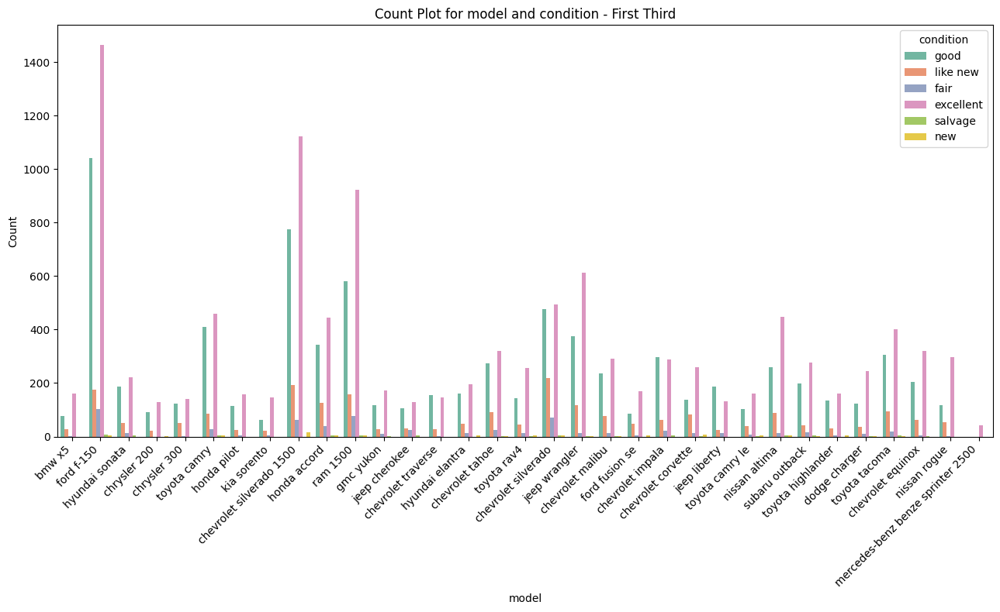

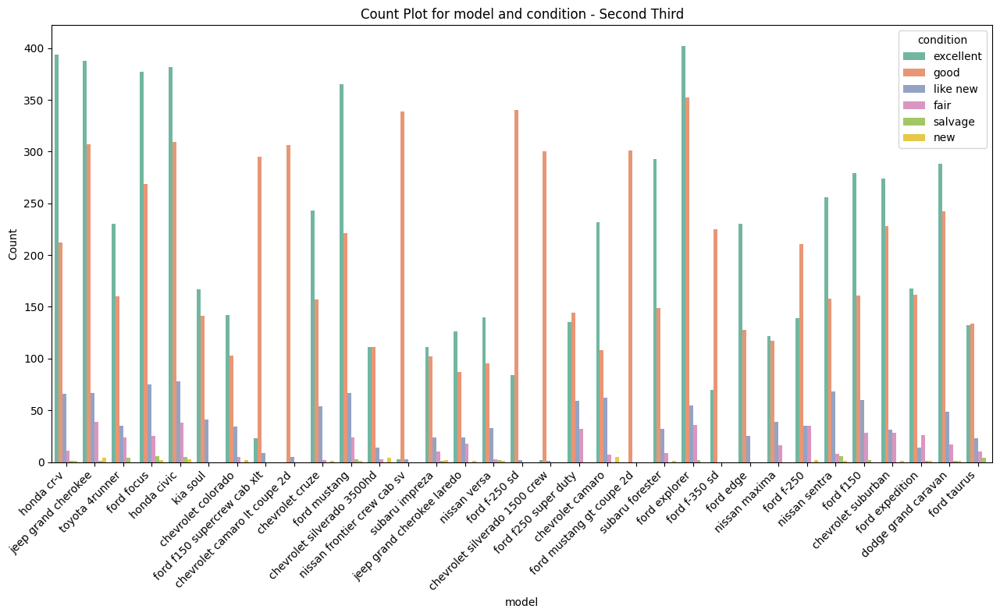

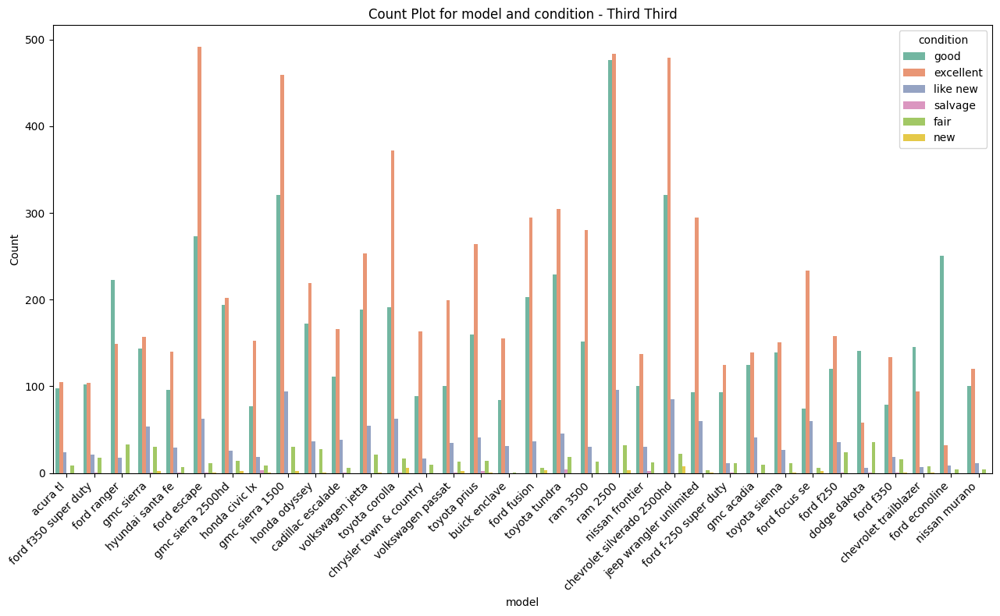

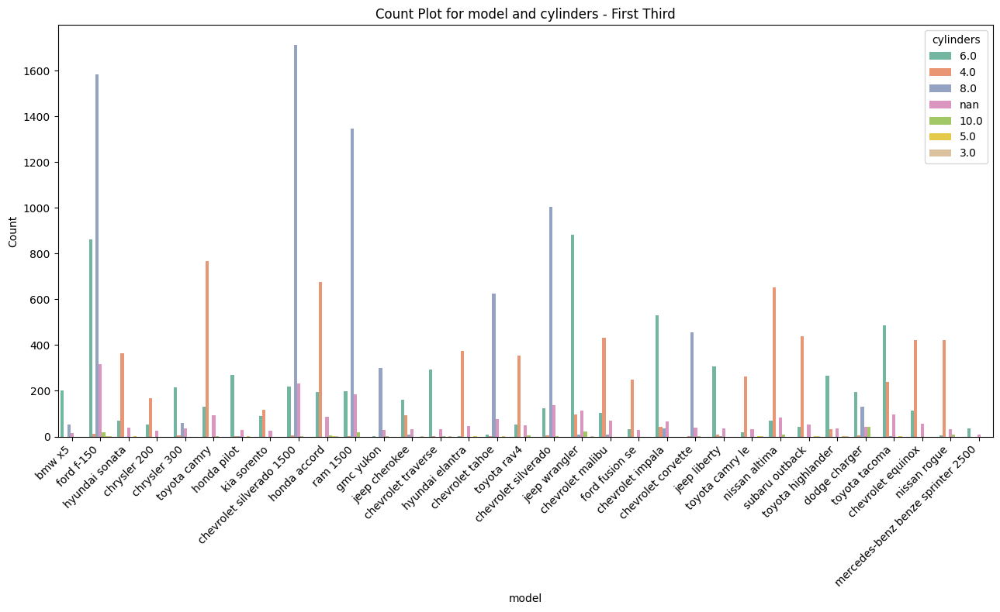

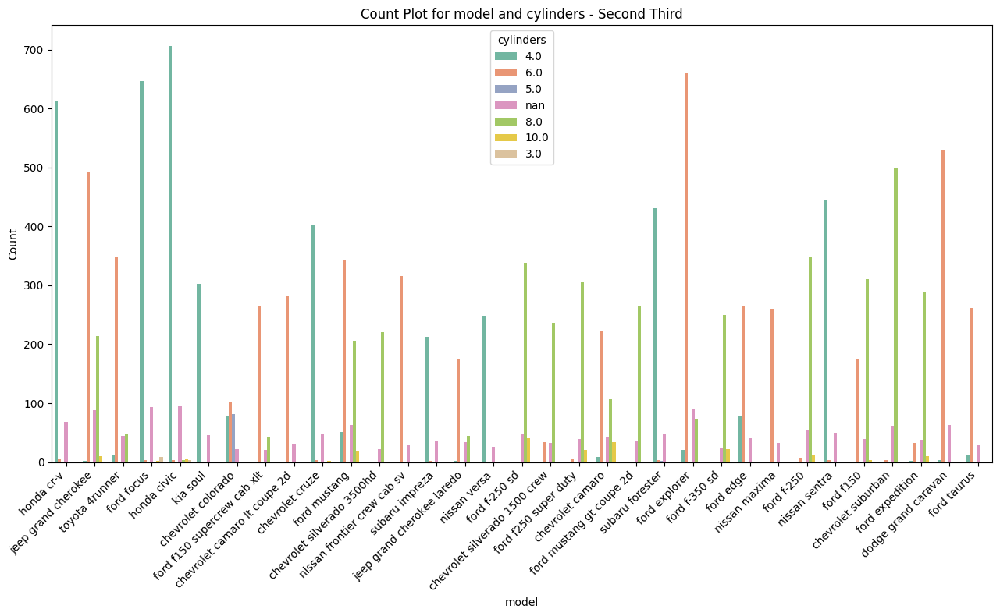

...

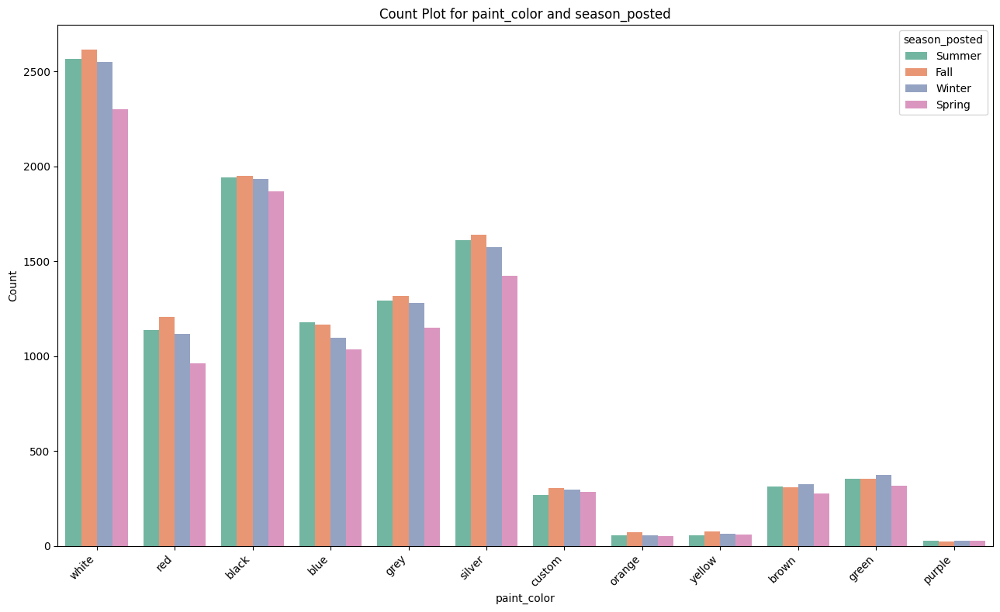

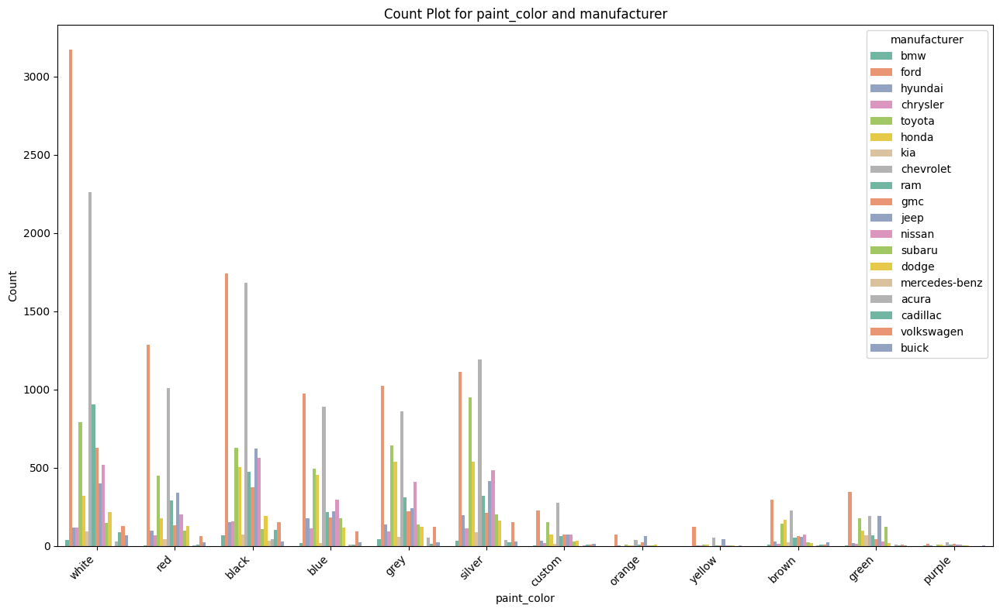

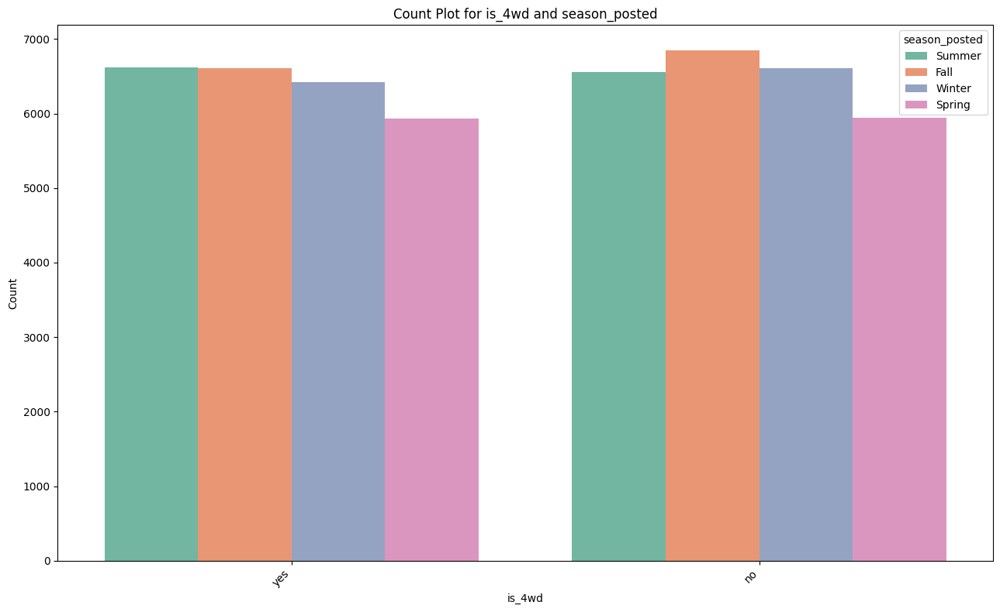

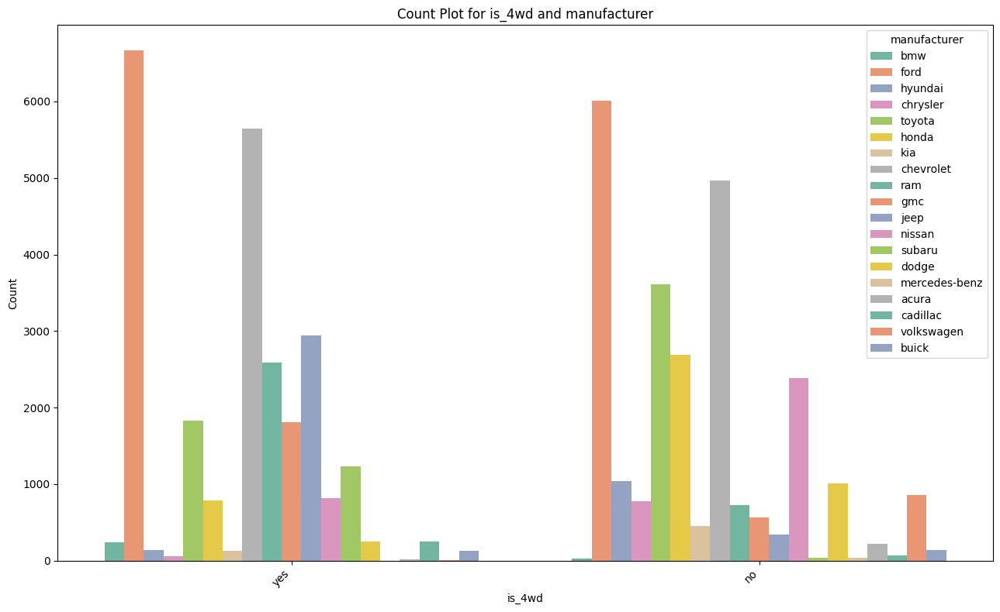

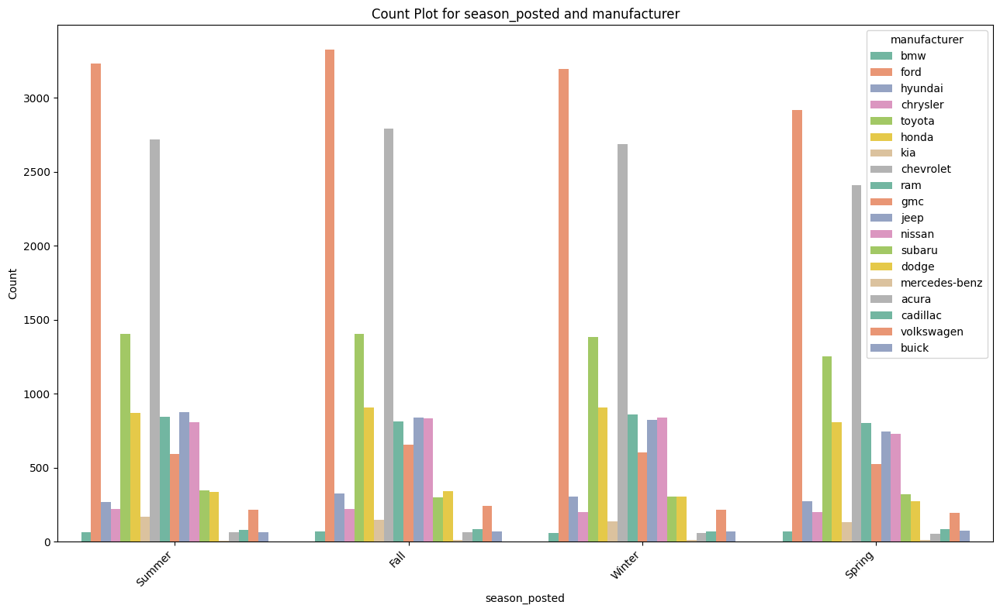

In [19]:
# Loop through each pair of categorical columns
for col1, col2 in itertools.combinations(categorical_df, 2):
    # Check if the column is 'model' and split the data accordingly
    if col1 == 'model' or col2 == 'model':
        # Models variable has too many values to be plotted on one histogram. Therefore, we will split it into three plots. 
        # Split the data into three parts based on the number of unique models
        unique_models = vehicles_df['model'].unique()  # Use original vehicles_df to get model names
        third_size = len(unique_models) // 3
        first_third = unique_models[:third_size]
        second_third = unique_models[third_size:2*third_size]
        third_third = unique_models[2*third_size:]

        # Create three separate plots for the 'model' column
        for data_subset, subset_name, models in zip([first_third, second_third, third_third], 
                                                     ['First Third', 'Second Third', 'Third Third'], 
                                                     [first_third, second_third, third_third]):
            plt.figure(figsize=(13, 8))  # Increase figure size

            # Filter the DataFrame to include only the models in the current subset
            data_filtered = vehicles_df[vehicles_df['model'].isin(models)]

            # Plot the countplot using the filtered data
            ax = sns.countplot(data=data_filtered, x=col1, hue=col2, palette='Set2')

            # Set plot title and labels
            plt.title(f'Count Plot for {col1} and {col2} - {subset_name}')
            plt.xlabel(col1)
            plt.ylabel('Count')

            # Only add the legend if there are multiple unique categories in 'col2'
            if data_filtered[col2].nunique() > 1:

                plt.legend(title=col2)
            else:
                ax.get_legend().set_visible(False)  # Hide legend if there's only one category in 'col2'
            
            # Rotate the x-axis labels to avoid overlap
            plt.xticks(rotation=45, ha='right')

            # Automatically adjust subplot parameters for better label fitting
            plt.tight_layout()

            plt.show()
    else:
        # For other columns (non 'model' pair), just generate the standard plot
        plt.figure(figsize=(13, 8))  # Increase figure size
        ax = sns.countplot(data=vehicles_df, x=col1, hue=col2, palette='Set2')
        plt.title(f'Count Plot for {col1} and {col2}')
        plt.xlabel(col1)
        plt.ylabel('Count')

        # Only add the legend if there are multiple unique categories in 'col2'
        if vehicles_df[col2].nunique() > 1:
            plt.legend(title=col2)
        else:
            ax.get_legend().set_visible(False)
        
        # Rotate the x-axis labels to avoid overlap
        plt.xticks(rotation=45, ha='right')

        # Automatically adjust subplot parameters for better label fitting
        plt.tight_layout()

        plt.show()

Correlations related to model: Ford Mustangs seem to be the most common model for manual transmission. Ford F-150s are being posted in the fall at a higher rate than other vehicles. Perhaps the dealership is trying to take advantage of football commercials whose target audience is typically men, and therefore is the same demographic of individuals who would be most interested in a Ford F-150. 

Correlations related to cylinders: The most common type of car with 8 cylinders appears to be a pickup truck. The most common type with 4 cylinders appears to be a sedan, and the most common type with 6 cylinders appears to be an SUV. Perhaps this is unsurprising the given the size and typicaly usage requirements of these respective cars. Cars with more than 4 cylinders tended to hae 4 wheel drive. This is unsurprising given the previously metioned relationship between cylinders and car type. 

Correlations related to fuel: Unsurprusingly, cares that used 4 wheel drive tended to use Diesl fuel more often than those that did not. This is because cars that tend to use diesel are usually bigger cars such us trucks and vans which are designed to drive well in harsh conditions. Hence, the relationship between diesel fuel and 4 wheel drive. Honda appeared to be the most common manufacturer for hybrid vehicles. This may be important information for environmentally friendly buyers who want to buy cars from manufacturers whose values align with theirs. 

Correlations related to type: The most popular paint color for trucks is white by far. Trucks SUVs and pickup trucks are typically have 4 wheel drive. Again this is unsurprising given the facts we noted about the correlations related to cylinders.  

Now let's check to see which of these relationships, if any, were statistically significant.

In [20]:
# Display the p_value matrix
p_value_matrix_cat

,model,condition,cylinders,fuel,transmission,type,paint_color,is_4wd,season_posted,manufacturer
model,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.046207,0.000000e+00
condition,0.000000,NaN,9.564933e-87,1.331511e-11,2.471359e-229,2.323390e-137,2.887972e-67,5.135387e-15,0.768861,5.194564e-67
cylinders,0.000000,9.564933e-87,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.787838,0.000000e+00
fuel,0.000000,1.331511e-11,0.000000e+00,NaN,2.399008e-50,0.000000e+00,2.346466e-81,0.000000e+00,0.015753,0.000000e+00
transmission,0.000000,2.471359e-229,0.000000e+00,2.399008e-50,NaN,0.000000e+00,4.042743e-114,1.353717e-14,0.146179,0.000000e+00
type,0.000000,2.323390e-137,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.000000e+00,0.000000e+00,0.453005,0.000000e+00
paint_color,0.000000,2.887972e-67,0.000000e+00,2.346466e-81,4.042743e-114,0.000000e+00,NaN,1.014144e-73,0.725420,0.000000e+00
is_4wd,0.000000,5.135387e-15,0.000000e+00,0.000000e+00,1.353717e-14,0.000000e+00,1.014144e-73,NaN,0.197059,0.000000e+00
season_posted,0.046207,7.688609e-01,7.878384e-01,1.575298e-02,1.461789e-01,4.530053e-01,7.254199e-01,1.970594e-01,NaN,6.213285e-01
manufacturer,0.000000,5.194564e-67,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.621329,NaN


In [21]:
# Display the statistical sifnificance matrix. 
significance_matrix_cat

,model,condition,cylinders,fuel,transmission,type,paint_color,is_4wd,season_posted,manufacturer
model,False,True,True,True,True,True,True,True,True,True
condition,True,False,True,True,True,True,True,True,False,True
cylinders,True,True,False,True,True,True,True,True,False,True
fuel,True,True,True,False,True,True,True,True,True,True
transmission,True,True,True,True,False,True,True,True,False,True
type,True,True,True,True,True,False,True,True,False,True
paint_color,True,True,True,True,True,True,False,True,False,True
is_4wd,True,True,True,True,True,True,True,False,False,True
season_posted,True,False,False,True,False,False,False,False,False,False
manufacturer,True,True,True,True,True,True,True,True,False,False


All none self correlations other than those with season_posted turned out to be statistically sigificant. This is likely due to 
the size of the data set. Now let's run the correlation analysis between the categorical variables and the numeric variables. 

In [22]:
# We do not want to include 'cylinders' in our analysis of the relatinoship between the categorical variables and the numeric
# variables because as an ordinal numeric variable the proper analysis to run between cylinders and the numeric variables is a 
# spearman's rank correlation analysis. Therefore, we are going to convert 'cylinders' back to a numeric variable, and drop it from categorical_df

# Label encode all categorical columns
for col in categorical_df:
    categorical_df[col] = categorical_df[col].astype('category').cat.codes

# Select numeric columns from the original dataframe
numeric_df = vehicles_df.select_dtypes(include=[np.number])

# Initialize empty correlation matrix for numeric and categorical correlation
numeric_cat_corr_matrix = pd.DataFrame(np.nan, index=numeric_df.columns, columns=categorical_df.columns)
numeric_cat_pvalue_matrix = pd.DataFrame(np.nan, index=numeric_df.columns, columns=categorical_df.columns)

# Calculate correlation between numeric columns and categorical columns
for numeric_col in numeric_df.columns:
    for cat_col in categorical_df.columns:
        # Drop rows with missing values for the pair of columns
        df_pair = vehicles_df[[numeric_col, cat_col]].dropna()
        
        # Split the numeric data into groups based on the categorical variable
        grouped_data = [df_pair[df_pair[cat_col] == category][numeric_col] for category in df_pair[cat_col].unique()]
        
        # Perform ANOVA test for the groups
        f_statistic, p_value = f_oneway(*grouped_data)

        # Store the F-statistic and p-value in the matrices
        numeric_cat_corr_matrix.at[numeric_col, cat_col] = f_statistic
        numeric_cat_pvalue_matrix.at[numeric_col, cat_col] = p_value

# Create statistical significance matrix 
numeric_cat_sigificance_matrix = numeric_cat_pvalue_matrix < .001

# SDisplay the numeric-categorical correlation matrix 
numeric_cat_corr_matrix



,model,condition,cylinders,fuel,transmission,type,paint_color,is_4wd,season_posted,manufacturer
price,198.317147,628.706857,775.952189,1190.139274,349.836990,763.808047,119.203796,5681.322619,2.020761,289.051461
model_year,101.198850,987.199332,197.049284,9.254216,1488.358601,106.805341,153.927434,90.331712,2.816458,74.979737
odometer,62.012370,904.377259,95.608058,234.703965,811.234108,98.564142,35.235807,57.462419,0.668642,59.235917
days_listed,0.970246,0.529476,0.655946,0.319608,1.749708,0.644679,0.604864,0.206806,0.975785,1.088639


Let's go ahead and plot some of these relationships. 

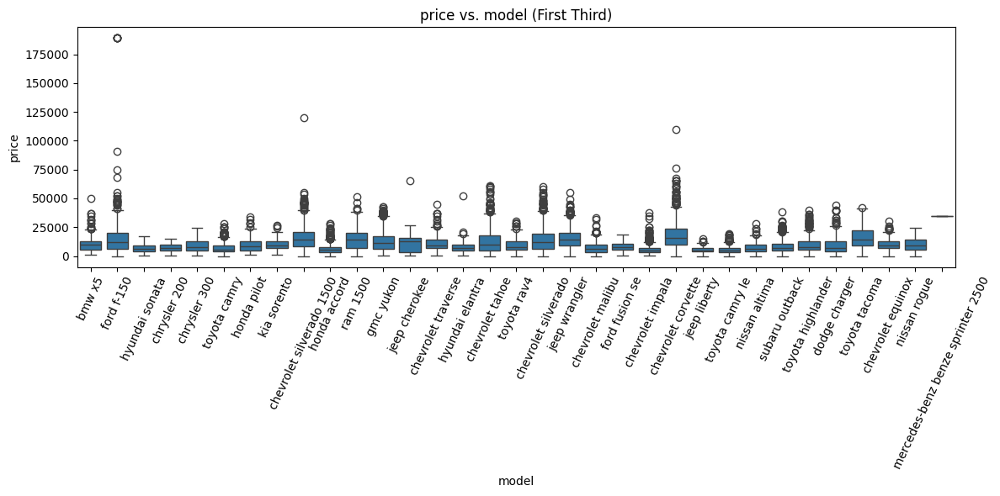

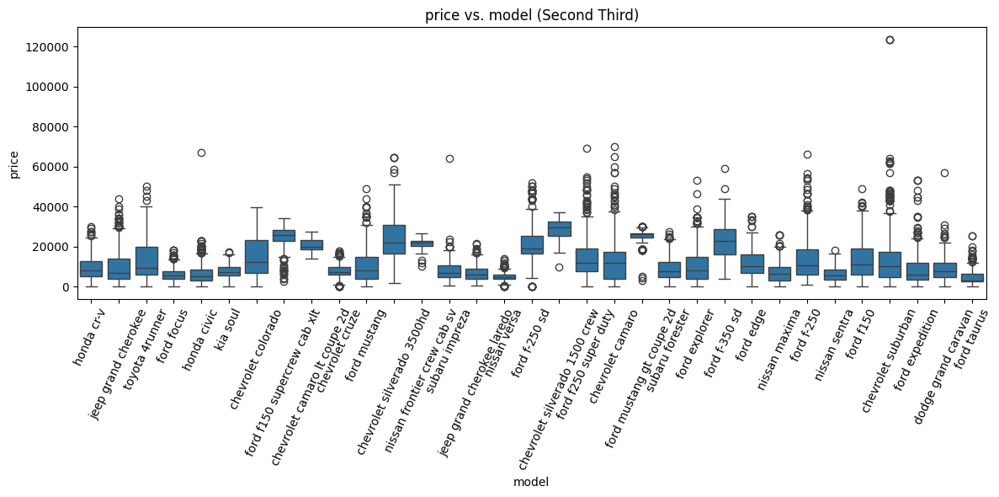

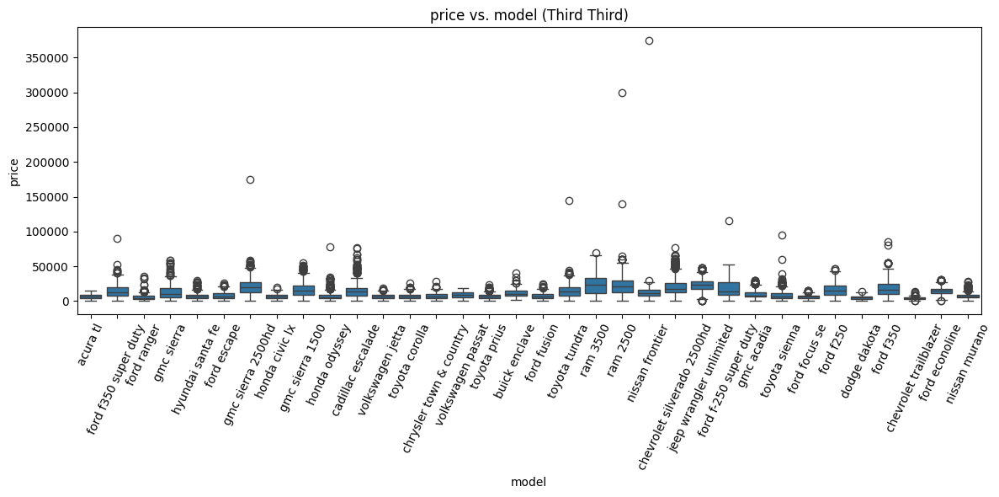

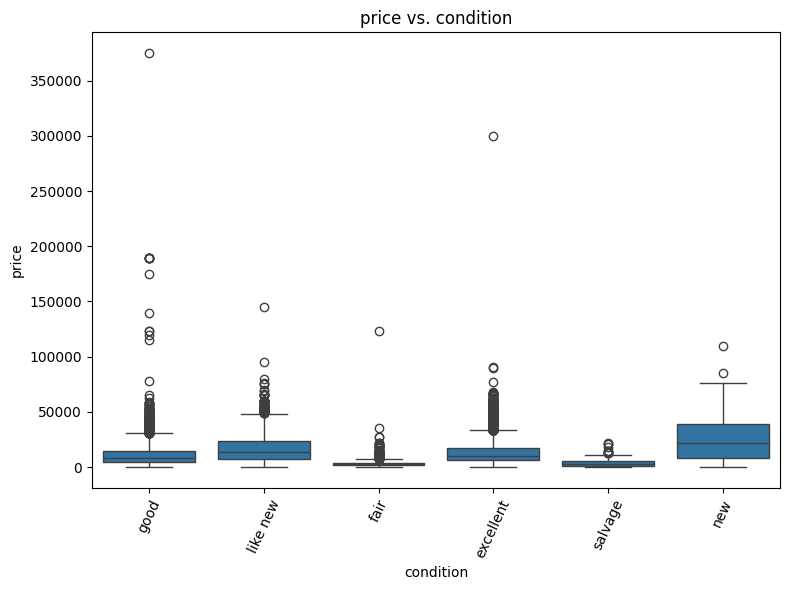

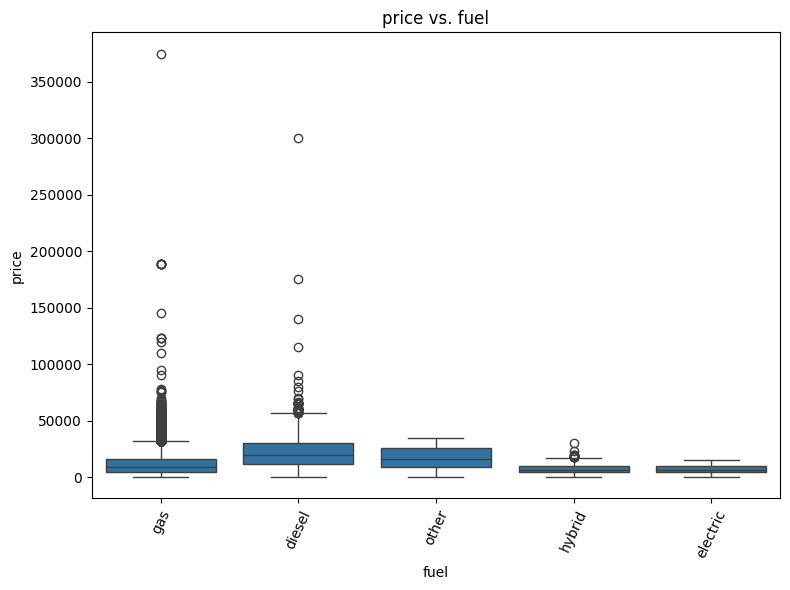

...

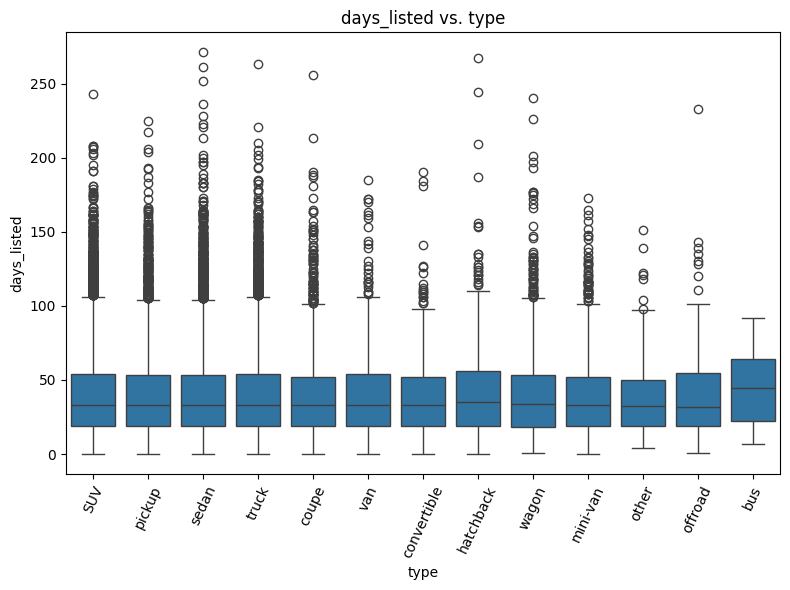

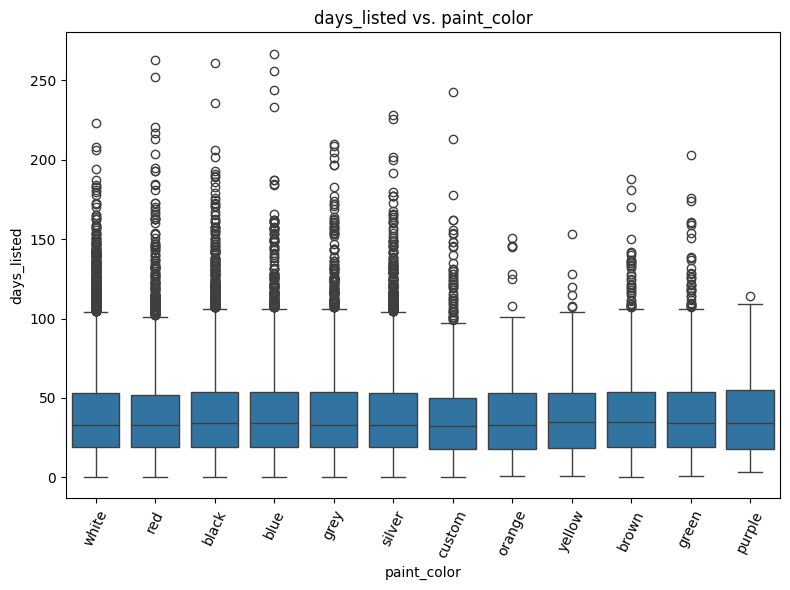

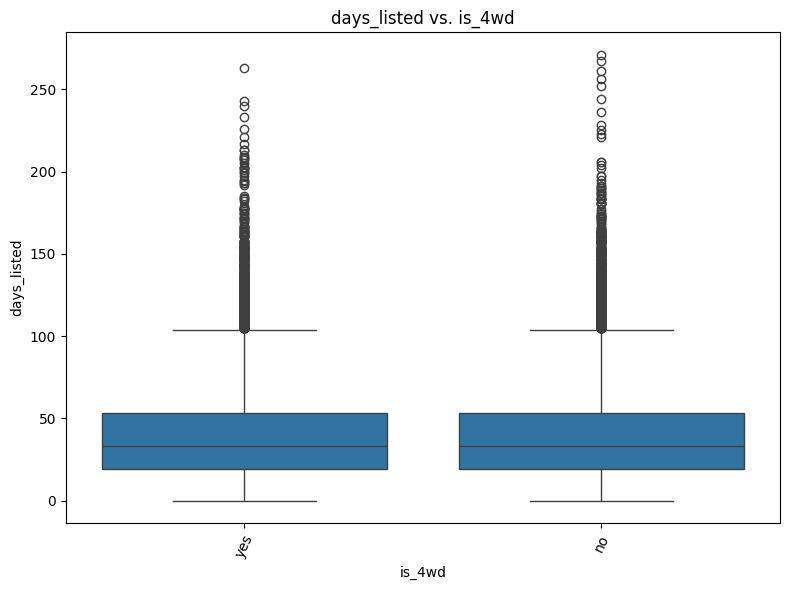

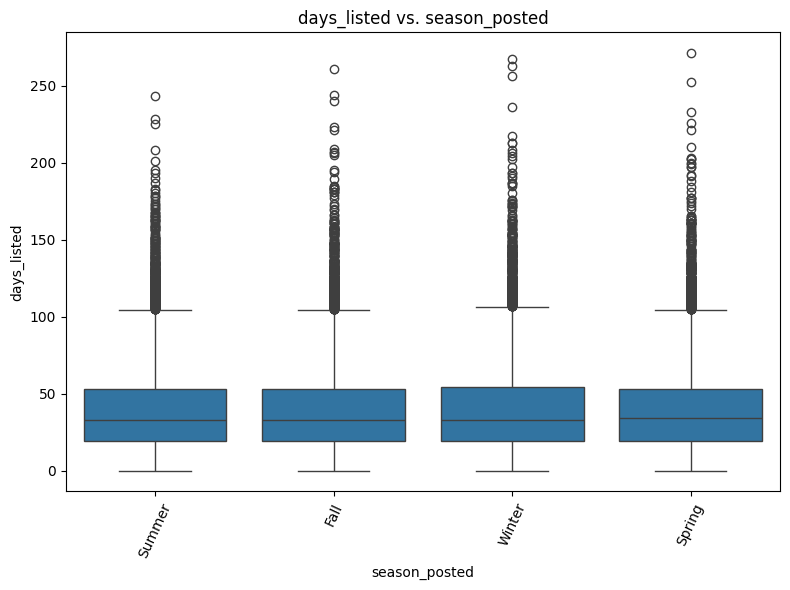

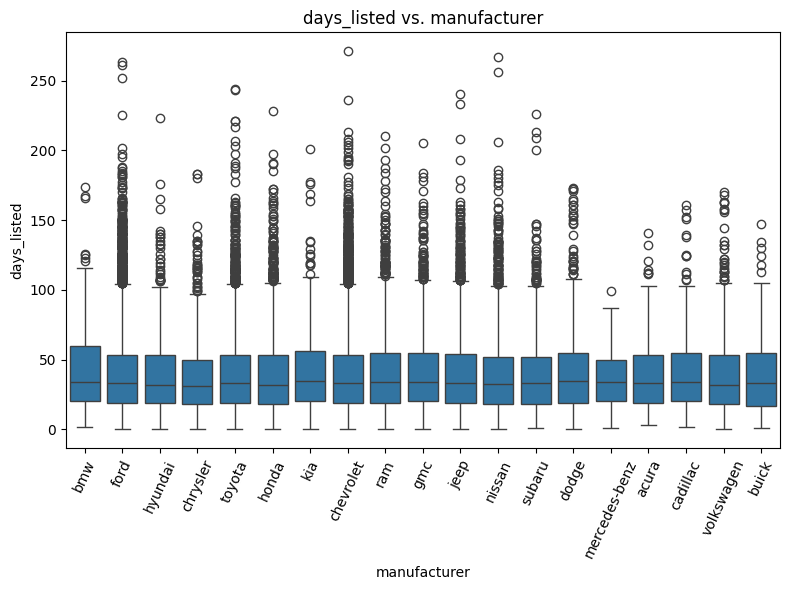

In [23]:
# Numeric variables list (correspond to rows in the matrix)
numeric_vars = ['price', 'model_year', 'cylinders', 'odometer', 'days_listed']

# Categorical variables list (correspond to columns in the matrix)
categorical_vars = ['model', 'condition', 'fuel', 'transmission', 'type', 'paint_color', 'is_4wd', 'season_posted', 'manufacturer']

# Loop through each pair of numeric and categorical variable
for num_var in numeric_vars:
    for cat_var in categorical_vars:
        # Check if the categorical variable is 'model'
        if cat_var == 'model':
            # Once again, models variable has too many values, and crowds the histogram. Therefore, onec again, we will split it into 3 different plots. 
            # Split the data into three parts for 'model' to avoid too many x-ticks on one plot
            model_unique_values = vehicles_df['model'].unique()
            third_size = len(model_unique_values) // 3
            first_third_models = model_unique_values[:third_size]
            second_third_models = model_unique_values[third_size:2*third_size]
            third_third_models = model_unique_values[2*third_size:]

            # Plot for the first third of 'model' values
            plt.figure(figsize=(12, 6))
            sns.boxplot(x=vehicles_df[vehicles_df['model'].isin(first_third_models)]['model'],
                        y=vehicles_df[vehicles_df['model'].isin(first_third_models)][num_var])
            plt.title(f'{num_var} vs. {cat_var} (First Third)')
            plt.xticks(rotation=65)  # Rotate x-axis labels if needed
            plt.tight_layout()
            plt.show()

            # Plot for the second third of 'model' values
            plt.figure(figsize=(12, 6))
            sns.boxplot(x=vehicles_df[vehicles_df['model'].isin(second_third_models)]['model'],
                        y=vehicles_df[vehicles_df['model'].isin(second_third_models)][num_var])
            plt.title(f'{num_var} vs. {cat_var} (Second Third)')
            plt.xticks(rotation=65)  # Rotate x-axis labels if needed
            plt.tight_layout()
            plt.show()

            # Plot for the third third of 'model' values
            plt.figure(figsize=(12, 6))
            sns.boxplot(x=vehicles_df[vehicles_df['model'].isin(third_third_models)]['model'],
                        y=vehicles_df[vehicles_df['model'].isin(third_third_models)][num_var])
            plt.title(f'{num_var} vs. {cat_var} (Third Third)')
            plt.xticks(rotation=65)  # Rotate x-axis labels if needed
            plt.tight_layout()
            plt.show()

        else:
            # Create a plot for other categorical variables
            plt.figure(figsize=(8, 6))
            sns.boxplot(x=cat_var, y=num_var, data=vehicles_df)
            plt.title(f'{num_var} vs. {cat_var}')
            plt.xticks(rotation=65)  # Rotate x-axis labels if needed
            plt.tight_layout()
            plt.show()

Now let's check to see if any of them are statistically significant. 

In [24]:
# Display the p_value matrix
numeric_cat_pvalue_matrix

,model,condition,cylinders,fuel,transmission,type,paint_color,is_4wd,season_posted,manufacturer
price,0.000000,0.000000,0.000000e+00,0.000000e+00,1.230574e-151,0.000000e+00,3.136870e-270,0.000000e+00,0.108633,0.000000e+00
model_year,0.000000,0.000000,1.805457e-289,1.798450e-07,0.000000e+00,1.777593e-263,0.000000e+00,2.103460e-21,0.037594,8.347588e-272
odometer,0.000000,0.000000,3.572081e-139,9.213354e-200,0.000000e+00,2.047697e-242,7.094315e-76,3.513024e-14,0.571182,7.366306e-201
days_listed,0.565082,0.754152,7.096561e-01,8.650223e-01,1.738349e-01,8.053816e-01,8.263955e-01,6.492847e-01,0.402970,3.560863e-01


In [25]:
# Display the statistical significance matrix. 
numeric_cat_sigificance_matrix

,model,condition,cylinders,fuel,transmission,type,paint_color,is_4wd,season_posted,manufacturer
price,True,True,True,True,True,True,True,True,False,True
model_year,True,True,True,True,True,True,True,True,False,True
odometer,True,True,True,True,True,True,True,True,False,True
days_listed,False,False,False,False,False,False,False,False,False,False


All correlations except for the ones involving 'days_listed' and 'season_posted came out as significant. Again, this likely has to do with the size of the data set. The app will offer effect size calculations to deal with this fact. 

In [26]:

# Initialize empty correlation matrix and p-value matrix
cylinders_corr_matrix = pd.DataFrame(np.nan, index=numeric_df.columns, columns=['correlation'])
cylinders_pvalue_matrix = pd.DataFrame(np.nan, index=numeric_df.columns, columns=['p_value'])

# Calculate Spearman's rank correlation for 'cylinders' vs each numeric column
for numeric_col in numeric_df.columns:
    # Drop rows with missing values for 'cylinders' and the current numeric column only
    df_pair = vehicles_df[[numeric_col, 'cylinders']].dropna()
    
    # Perform Spearman's rank correlation
    result = spearmanr(df_pair['cylinders'], df_pair[numeric_col])
    
    # Handle case where correlation is calculated for 'cylinders' vs itself
    if numeric_col == 'cylinders':
        corr, p_value = 1.0, 0.0  # Perfect correlation, p-value = 0 (since it's self-correlated)
    else:
        corr, p_value = result  # Unpack the tuple directly for other cases
    
    # Store the correlation and p-value in the respective matrices
    cylinders_corr_matrix.at[numeric_col, 'correlation'] = corr
    cylinders_pvalue_matrix.at[numeric_col, 'p_value'] = p_value
    
# Create a statistical significance matrix
cylinders_significance_matrix = cylinders_pvalue_matrix < .001

# Display the matrix for the relationship between cylinders and the numeric variables. 
cylinders_corr_matrix



,correlation
price,0.260115
model_year,-0.128039
odometer,0.099283
days_listed,0.003090


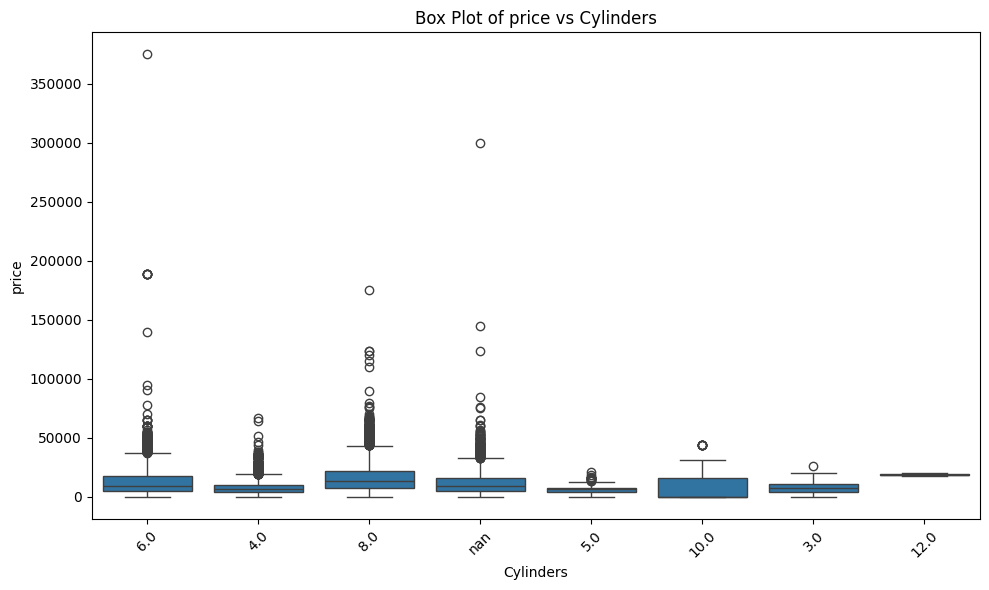

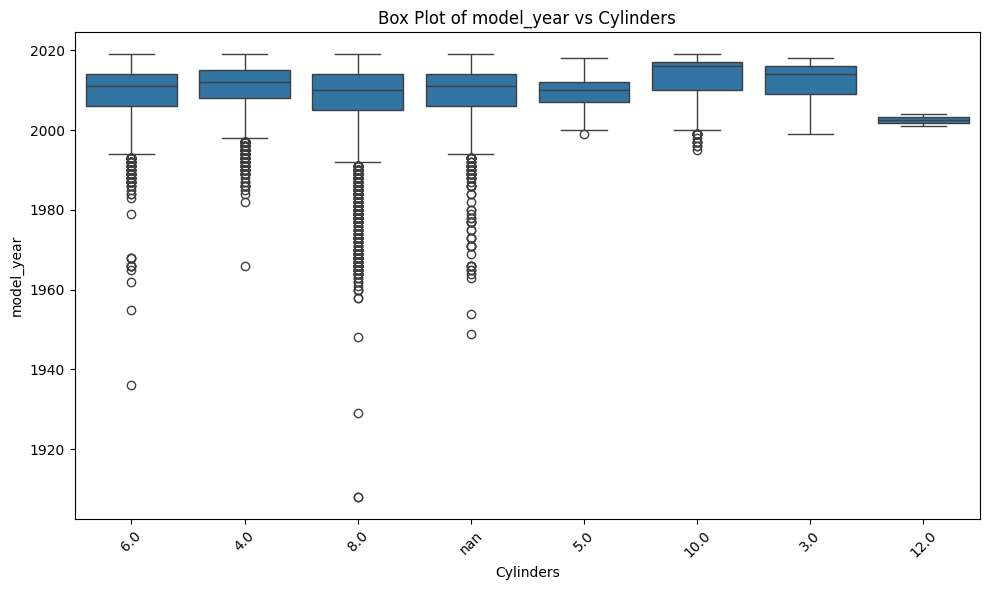

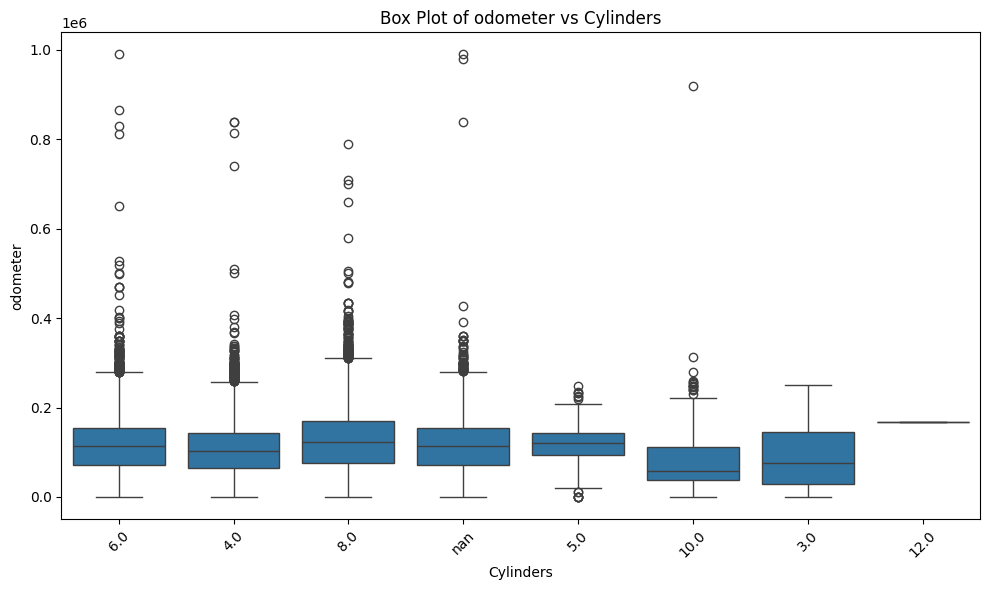

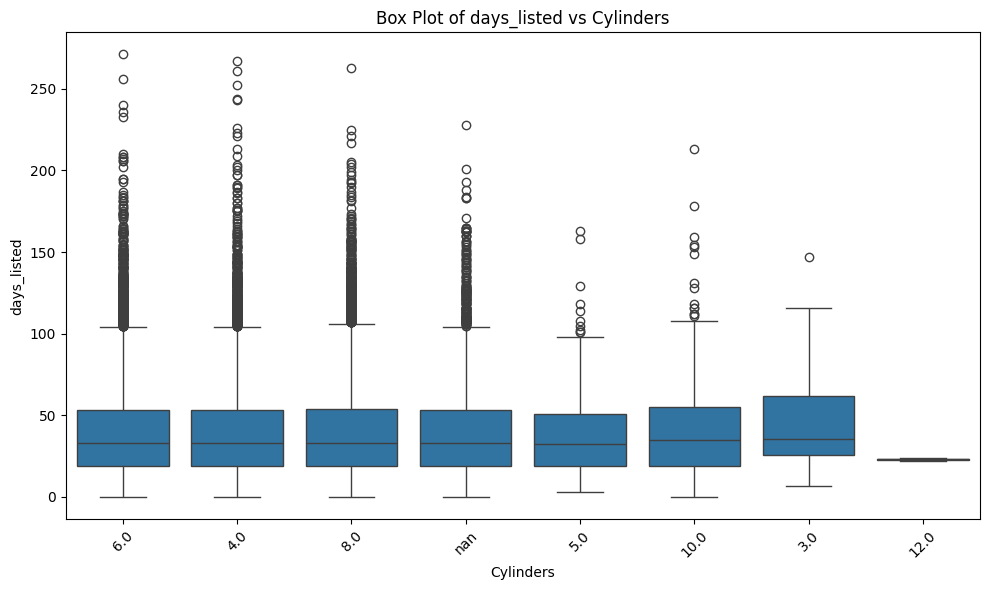

In [27]:
# List of numeric variables to plot (based on the correlation matrix)
numeric_vars = ['price', 'model_year', 'odometer', 'days_listed']

# Create a boxplot for each of the numeric variables vs 'cylinders'
for num_var in numeric_vars:
    plt.figure(figsize=(10, 6))  # Increase figure size for better readability

    # Create the boxplot
    sns.boxplot(x='cylinders', y=num_var, data=vehicles_df)

    # Set plot title and labels
    plt.title(f'Box Plot of {num_var} vs Cylinders')
    plt.xlabel('Cylinders')
    plt.ylabel(num_var)

    # Rotate x-axis labels if needed (to prevent overlapping)
    plt.xticks(rotation=45)

    # Automatically adjust subplot parameters for better label fitting
    plt.tight_layout()

    # Show the plot
    plt.show()

Interestingly, 12 cylinder vehicles seemed to manufactured only in the 2000s. 

In [28]:
# Display the p_values matrix 
cylinders_pvalue_matrix

,p_value
price,0.000000e+00
model_year,3.205428e-174
odometer,5.378584e-96
days_listed,4.831112e-01


In [29]:
# Display the statistical significance matrix. 
cylinders_significance_matrix

,p_value
price,True
model_year,True
odometer,True
days_listed,False


Once again, all of the significant results likely have to do with the large size of the data set. Now, that you have perused through some of the data, please go check out the app.  